<a href="https://colab.research.google.com/github/bowserd1/California-Housing-Project/blob/main/Exploratory_Analysis_California_Housing_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 
import ydata_profiling
from ydata_profiling import ProfileReport


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
%matplotlib inline
import matplotlib.pyplot as plt
import statsmodels.api as sm 
from statsmodels.graphics.api import abline_plot 
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.metrics import mean_squared_error
from google.colab import files

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
housing_df=pd.read_csv('/content/drive/MyDrive/Colab Data Sets/housing_wrangled.csv')

In [ ]:
import numpy as np
import geopy.distance

coast = np.array([[32.664472968971786, -117.16139777220666],
         [33.20647603453836, -117.38308931734736],
         [33.77719697387153, -118.20238415808473],
         [34.46343131623148, -120.01447157053916],
         [35.42731619324845, -120.8819602254066],
         [35.9284107340049, -121.48920228383551],
         [36.982737132545495, -122.028973002425],
         [37.61147966825591, -122.49163361836126],
         [38.3559871217218, -123.06032062543764],
         [39.79260770260524, -123.82178288918176],
         [40.799744611668416, -124.18805587680554],
         [41.75588735544064, -124.19769463963775]])

def geodesic_dist(x, y):
    return geopy.distance.geodesic(x, y).miles

def coast_dist(df):
    for i in range(len(coast)):
        df[f'coast_{i}'] = df.apply(lambda x: geodesic_dist((x.Latitude, x.Longitude),coast[i]), axis=1)

    df['coast_min'] = np.min(df[[f'coast_{i}' for i in range(len(coast))]],axis=1)

    return df

One other feature that may be important is how close the homes are to the coast. I added that feature using the code above.

In [ ]:
housing_df.set_index('id', drop = True, inplace = True)
housing_df.drop('Unnamed: 0', axis = 1, inplace = True)

In [ ]:
coast_dist(housing_df)

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,bedrooms_per_room,...,coast_3,coast_4,coast_5,coast_6,coast_7,coast_8,coast_9,coast_10,coast_11,coast_min
id,,,,,,,,,,,,,,,,,,,,,
0,2.3859,15.0,3.827160,1.112100,1280.0,2.486989,34.60,-120.12,0.980,0.290581,...,11.173906,71.553842,119.912718,196.164897,246.391232,306.355079,412.124059,482.049671,541.013754,11.173906
1,3.7188,17.0,6.013373,1.054217,1504.0,3.813084,38.69,-121.22,0.946,0.175312,...,299.039855,225.765316,191.020733,125.784837,101.635816,102.345660,158.940629,214.853028,263.681222,101.635816
2,4.7750,27.0,6.535604,1.103175,1061.0,2.464602,34.71,-120.45,1.576,0.168795,...,30.088456,55.177395,102.482816,180.016728,230.312286,290.312015,396.656891,467.092175,526.864922,30.088456
3,2.4138,16.0,3.350203,0.965432,1255.0,2.089286,32.66,-117.09,1.336,0.288171,...,209.554624,289.289384,337.691802,409.284550,458.166511,516.915509,618.668636,685.186311,739.056753,4.173130
4,3.7500,52.0,4.284404,1.069246,1793.0,1.604790,37.80,-122.41,4.500,0.249567,...,266.198331,184.333411,138.774836,60.133890,13.749526,52.225348,157.156873,227.814821,289.016800,13.749526
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37132,3.3438,50.0,4.936508,1.079365,1775.0,3.022222,34.19,-118.36,1.856,0.218650,...,96.467910,166.828241,214.041591,282.377413,330.624992,388.951962,490.223786,556.772298,611.084819,29.856489
37133,3.7308,26.0,5.087533,0.966019,1006.0,4.316901,37.32,-121.86,1.588,0.189880,...,222.491054,141.436420,98.143517,25.058244,40.119893,97.031282,200.928561,270.705750,330.483731,25.058244
37134,4.1716,52.0,4.678862,1.101485,1156.0,1.431734,37.75,-122.44,3.387,0.235417,...,264.104160,182.080406,136.214665,57.546089,9.963633,53.771023,159.429604,230.306438,291.770326,9.963633


In [ ]:
housing_df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,bedrooms_per_room,...,coast_3,coast_4,coast_5,coast_6,coast_7,coast_8,coast_9,coast_10,coast_11,coast_min
id,,,,,,,,,,,,,,,,,,,,,
0,2.3859,15.0,3.827160,1.112100,1280.0,2.486989,34.60,-120.12,0.980,0.290581,...,11.173906,71.553842,119.912718,196.164897,246.391232,306.355079,412.124059,482.049671,541.013754,11.173906
1,3.7188,17.0,6.013373,1.054217,1504.0,3.813084,38.69,-121.22,0.946,0.175312,...,299.039855,225.765316,191.020733,125.784837,101.635816,102.345660,158.940629,214.853028,263.681222,101.635816
2,4.7750,27.0,6.535604,1.103175,1061.0,2.464602,34.71,-120.45,1.576,0.168795,...,30.088456,55.177395,102.482816,180.016728,230.312286,290.312015,396.656891,467.092175,526.864922,30.088456
3,2.4138,16.0,3.350203,0.965432,1255.0,2.089286,32.66,-117.09,1.336,0.288171,...,209.554624,289.289384,337.691802,409.284550,458.166511,516.915509,618.668636,685.186311,739.056753,4.173130
4,3.7500,52.0,4.284404,1.069246,1793.0,1.604790,37.80,-122.41,4.500,0.249567,...,266.198331,184.333411,138.774836,60.133890,13.749526,52.225348,157.156873,227.814821,289.016800,13.749526


In [ ]:
coasts = ['coast_0','coast_1', 'coast_2', 'coast_3', 'coast_4','coast_5', 'coast_6', 'coast_7', 'coast_8','coast_9', 'coast_10', 'coast_11']
housing_df.drop(coasts, axis = 1, inplace = True)

In [ ]:
housing_df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,bedrooms_per_room,occupancy_per_room,occupancy_per_bedroom,housing_tuple,key,Miles_to_City,Nearest_City,pop_april_1990,Pop_To_Miles_Ratio,coast_min
id,,,,,,,,,,,,,,,,,,,
0,2.3859,15.0,3.827160,1.112100,1280.0,2.486989,34.60,-120.12,0.980,0.290581,0.649826,2.236300,"(34.6, -120.12)",1,113.743686,Los Angeles,3485398.0,30642.562529,11.173906
1,3.7188,17.0,6.013373,1.054217,1504.0,3.813084,38.69,-121.22,0.946,0.175312,0.634101,3.616983,"(38.69, -121.22)",1,90.780508,San Francisco,723959.0,7974.828676,101.635816
2,4.7750,27.0,6.535604,1.103175,1061.0,2.464602,34.71,-120.45,1.576,0.168795,0.377104,2.234099,"(34.71, -120.45)",1,133.985533,Los Angeles,3485398.0,26013.241273,30.088456
3,2.4138,16.0,3.350203,0.965432,1255.0,2.089286,32.66,-117.09,1.336,0.288171,0.623630,2.164094,"(32.66, -117.09)",1,5.467741,San Diego,1110549.0,203109.299308,4.173130
4,3.7500,52.0,4.284404,1.069246,1793.0,1.604790,37.80,-122.41,4.500,0.249567,0.374566,1.500861,"(37.8, -122.41)",1,1.804140,San Francisco,723959.0,401276.469854,13.749526


In [ ]:
profile = ProfileReport(housing_df, title = 'Housing Data', html={'style':{'full_width':True}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

First, I ran pandas profiling on the dataframe to get a feel for all of the features.
A few important things to note after running a profile report on the California housing data:
1. The id value is unique and there are no duplicates in the data.
2. When we look at the correlations, it looks like MedInc and AveRooms are most highly correlated to MedHouseVal. This will be something to keep in mind later on in the analysis.
3. There are no missing values in the dataset.
4. The latitude and longitude both have some values which occur much more often than others. A quick check shows that the largest frequency lie in and around Los Angeles while the second largest frequency land in and around San Francisco. This makes sense.
5. Looking through the distributions of each column, a few things stick out:
  a. The housing age column has a distribution that makes sense except that over 2000 (5.6%) of the housing blocks have an average home age of 52 years, which is by far the maximum. While it is probable that these housing blocks just have homes that are 52 years or older, this may need to be investigated further.
  b. The population values vary widely from a minimum of 3 people in a population block to over 35,000 people in a block. Reading more about the source of the data here: https://scikit-learn.org/stable/datasets/real_world.html#california-housing-dataset shows that some of small values could be due to the homes in that area being vacation homes. This seems to make sense, although this may need a deeper dive.
  c. The target variable, MedHouseVal looks like it has a somewhat normal distribution, and one that we would expect, except that the maximum value and the mode are the same, with over 1800 blocks (5% of the data) having a median home value of just over $500,000.
  d. MedInc looks like something we would expect, although there are several outliers with incomes just over $1.5 million (59) while there are only 4 instances of incomes at $1.5 million.
  e. AveOccup shows the average number of household members. This also has some outliers, with one population block having over 500 and several others having more than 10. The mean of all blocks is still less than 3.

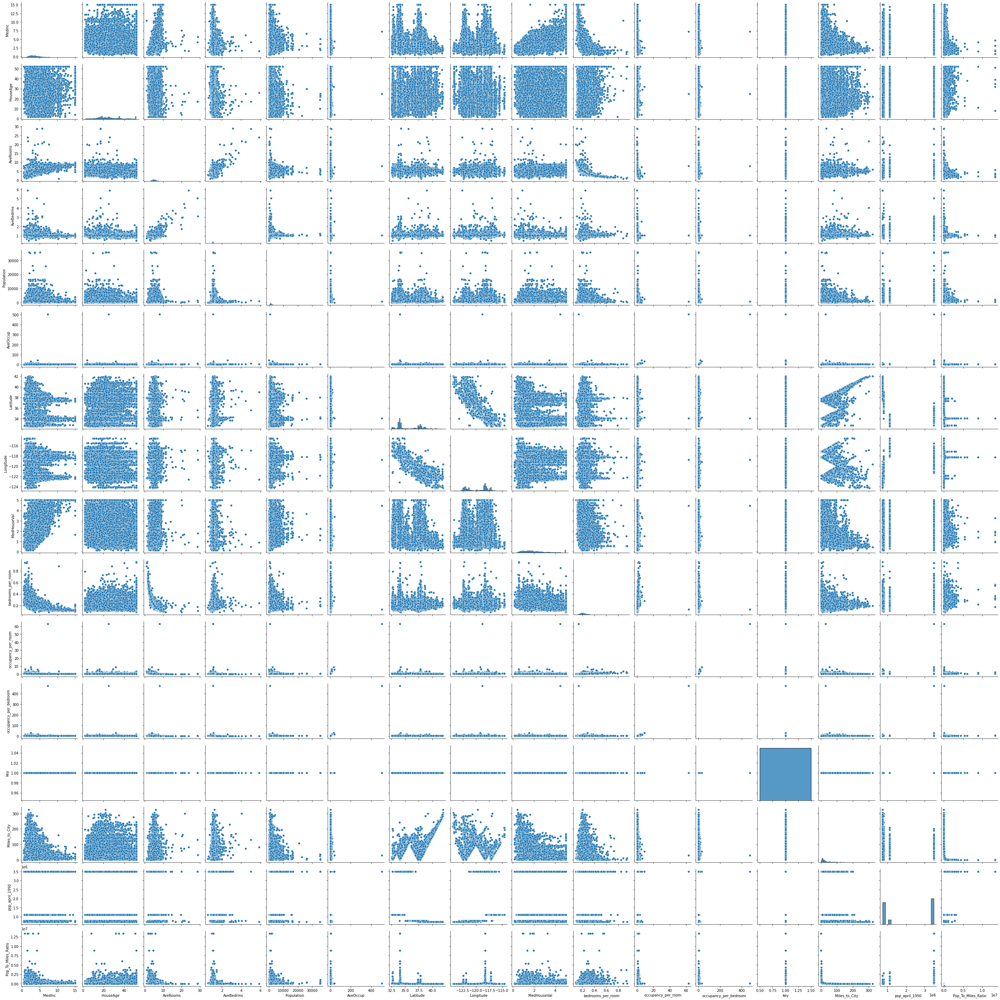

In [ ]:
sns.pairplot(housing_df)

Now, I ran a pair plot on all of the variables to have a better visual representation of how the different variables are related.

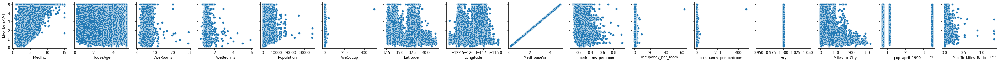

In [ ]:
g= sns.PairGrid(housing_df, y_vars=['MedHouseVal'])
g.map(sns.scatterplot)

Next, I ran a pair plot on just the Median Home Values to get a better feel for how correlated each of the different varaibles are with the Median Home Values. 



In [ ]:
summaries_by_city = housing_df.groupby('Nearest_City')[['MedHouseVal','pop_april_1990']].mean().sort_values('MedHouseVal')
print(summaries_by_city)

               MedHouseVal  pop_april_1990
Nearest_City                              
San Diego         1.687082       1110549.0
San Francisco     1.939028        723959.0
San Jose          2.035769        782248.0
Los Angeles       2.236537       3485398.0


In [ ]:
summaries_by_city = summaries_by_city.reset_index()
print(summaries_by_city)

    Nearest_City  MedHouseVal  pop_april_1990
0      San Diego     1.687082       1110549.0
1  San Francisco     1.939028        723959.0
2       San Jose     2.035769        782248.0
3    Los Angeles     2.236537       3485398.0


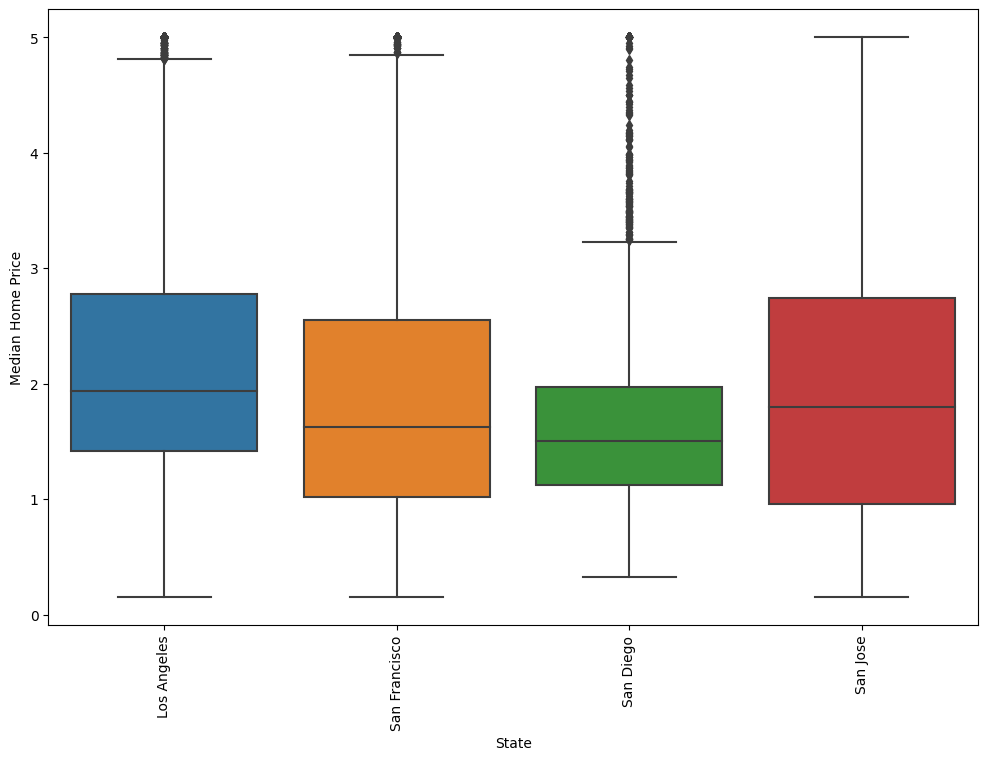

In [ ]:
plt.subplots(figsize=(12, 8))
sns.boxplot(x='Nearest_City', y='MedHouseVal', data=housing_df)
plt.xticks(rotation='vertical')
plt.ylabel('Median Home Price')
plt.xlabel('State');

In doing EDA, one thing I noticed is that the location matters a lot when it comes to the median home value. The only value we have that refers to the city is the population of the nearest city, and the population isn't necessarily a good indicator of the median home value.

Nearest_City
Los Angeles      Axes(0.125,0.11;0.775x0.77)
San Diego        Axes(0.125,0.11;0.775x0.77)
San Francisco    Axes(0.125,0.11;0.775x0.77)
San Jose         Axes(0.125,0.11;0.775x0.77)
dtype: object

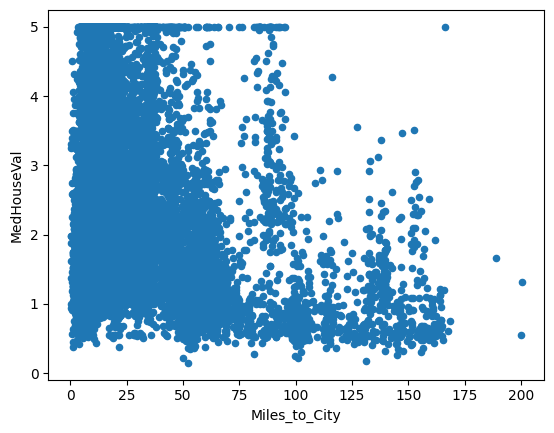

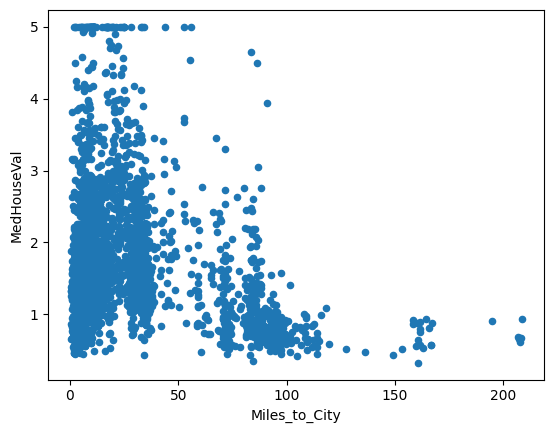

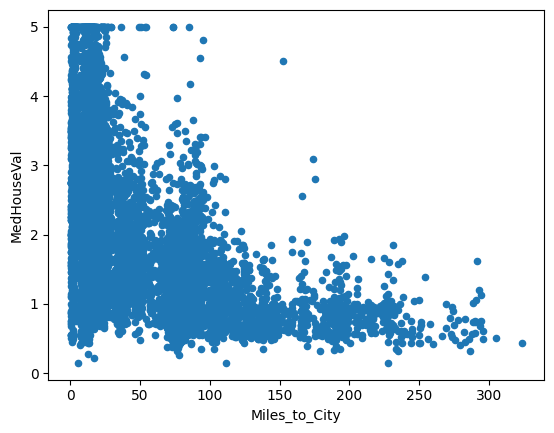

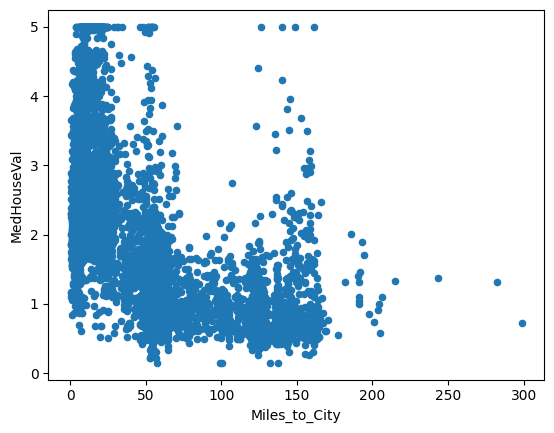

In [ ]:
housing_df.groupby('Nearest_City').plot(x='Miles_to_City', y='MedHouseVal', kind='scatter')

As we can see above, there is some correlation between the distance to a major city and the median home value for all four cities.

In [ ]:
city_income = {'San Diego': 33686,'Los Angeles': 30925, 'San Jose': 46206, 'San Francisco': 33414}

Using data from https://usa.ipums.org/usa/resources/voliii/pubdocs/1990/cph-l/cphl129h.pdf we make a dictionary of median incomes in our target cities.

In [ ]:
type(city_income)

dict

In [ ]:
city_income_df = pd.DataFrame.from_dict(city_income,orient = 'index', columns = ['City_Income'])

In [ ]:
city_income_df =city_income_df.reset_index()

In [ ]:
city_income_df = city_income_df.rename(columns = {'index': 'city'})

In [ ]:
print(city_income_df)

            city  City_Income
0      San Diego        33686
1    Los Angeles        30925
2       San Jose        46206
3  San Francisco        33414


In [ ]:
housing_df = housing_df.merge(city_income_df[['City_Income','city']], left_on='Nearest_City', right_on='city',how='left')

Here, I added another feature which is the population of the city that the housing block is nearest. It's possible that the population of the nearest city has some bearing on price.

In [ ]:
housing_df = housing_df.drop('city', axis=1)

In [ ]:
housing_scale = housing_df.drop(['Nearest_City', 'housing_tuple'], axis = 1)
housing_scale_index = housing_scale.index
housing_scale_columns=housing_scale.columns
housing_scale.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,bedrooms_per_room,occupancy_per_room,occupancy_per_bedroom,key,Miles_to_City,pop_april_1990,Pop_To_Miles_Ratio,coast_min,City_Income
0,2.3859,15.0,3.827160,1.112100,1280.0,2.486989,34.60,-120.12,0.980,0.290581,0.649826,2.236300,1,113.743686,3485398.0,30642.562529,11.173906,30925
1,3.7188,17.0,6.013373,1.054217,1504.0,3.813084,38.69,-121.22,0.946,0.175312,0.634101,3.616983,1,90.780508,723959.0,7974.828676,101.635816,33414
2,4.7750,27.0,6.535604,1.103175,1061.0,2.464602,34.71,-120.45,1.576,0.168795,0.377104,2.234099,1,133.985533,3485398.0,26013.241273,30.088456,30925
3,2.4138,16.0,3.350203,0.965432,1255.0,2.089286,32.66,-117.09,1.336,0.288171,0.623630,2.164094,1,5.467741,1110549.0,203109.299308,4.173130,33686
4,3.7500,52.0,4.284404,1.069246,1793.0,1.604790,37.80,-122.41,4.500,0.249567,0.374566,1.500861,1,1.804140,723959.0,401276.469854,13.749526,33414


In [ ]:
housing_scale=scale(housing_scale)

In [ ]:
housing_scale_df = pd.DataFrame(housing_scale, columns = housing_scale_columns)
housing_scale_df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,bedrooms_per_room,occupancy_per_room,occupancy_per_bedroom,key,Miles_to_City,pop_april_1990,Pop_To_Miles_Ratio,coast_min,City_Income
0,-0.812542,-0.909438,-1.107556,0.517112,-0.292355,-0.127389,-0.465655,-0.286561,-0.949244,1.296319,0.184396,-0.175236,0.0,1.881201,1.011293,-0.476824,-0.814182,-0.634027
1,-0.073333,-0.744939,0.704884,-0.082782,-0.120372,0.363325,1.497717,-0.843804,-0.978591,-0.737930,0.144539,0.366809,0.0,1.319232,-1.048951,-0.545719,2.071512,-0.180839
2,0.512422,0.077561,1.137830,0.424614,-0.460500,-0.135674,-0.412851,-0.453734,-0.434810,-0.852950,-0.506835,-0.176100,0.0,2.376572,1.011293,-0.490894,-0.210817,-0.634027
3,-0.797069,-0.827188,-1.502969,-1.002942,-0.311550,-0.274557,-1.396937,1.248393,-0.641965,1.253793,0.117999,-0.203584,0.0,-0.768595,-0.760526,0.047361,-1.037504,-0.131314
4,-0.056030,2.133811,-0.728487,0.072984,0.101517,-0.453842,1.070480,-1.446641,2.089024,0.572514,-0.513269,-0.463964,0.0,-0.858253,-1.048951,0.649659,-0.732021,-0.180839


In [ ]:
housing_pca = PCA().fit(housing_scale_df)

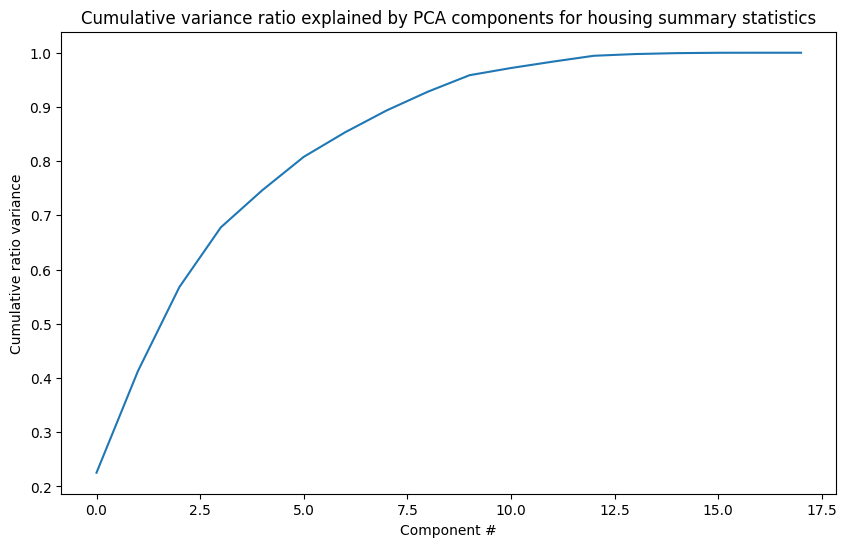

In [ ]:
plt.subplots(figsize=(10, 6))
plt.plot(housing_pca.explained_variance_ratio_.cumsum())
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio explained by PCA components for housing summary statistics')
plt.show()

I scaled the data and performed PCA on it. Component reduction doesn't seem to be of much benfit in this instance. 

In [ ]:
housing_pca_x = housing_pca.transform(housing_scale_df)
housing_pca_x.shape

(37137, 18)

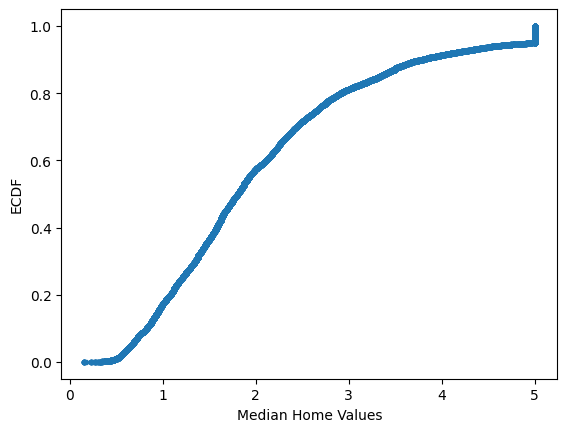

In [ ]:
x=np.sort(housing_df['MedHouseVal'])
y=np.arange(1,len(x)+1)/len(x)
plt.plot(x,y,marker = '.', linestyle = 'none')
plt.xlabel('Median Home Values')
plt.ylabel('ECDF');
plt.show()

Looking back at the pair plots, I graphed some of the more interesting features against the Median House Values to better understand these important features. Below, I plotted the miles to the nearest city and median income vs. Median House Values.

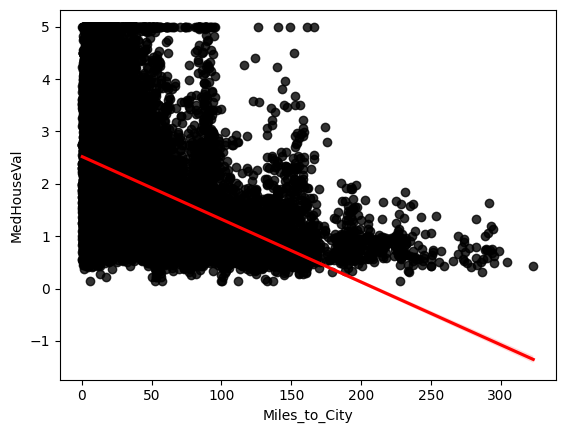

In [ ]:
sns.regplot(x='Miles_to_City', y='MedHouseVal', data = housing_df, scatter_kws={"color": "black"}, line_kws={"color": "red"})
plt.show()

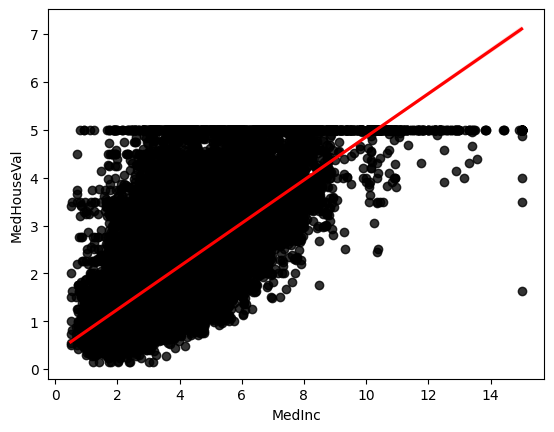

In [ ]:
sns.regplot(x='MedInc', y='MedHouseVal', data = housing_df, scatter_kws={"color": "black"}, line_kws={"color": "red"})
plt.show()

In [ ]:
housing_df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,bedrooms_per_room,occupancy_per_room,occupancy_per_bedroom,housing_tuple,key,Miles_to_City,Nearest_City,pop_april_1990,Pop_To_Miles_Ratio,coast_min,City_Income
0,2.3859,15.0,3.827160,1.112100,1280.0,2.486989,34.60,-120.12,0.980,0.290581,0.649826,2.236300,"(34.6, -120.12)",1,113.743686,Los Angeles,3485398.0,30642.562529,11.173906,30925
1,3.7188,17.0,6.013373,1.054217,1504.0,3.813084,38.69,-121.22,0.946,0.175312,0.634101,3.616983,"(38.69, -121.22)",1,90.780508,San Francisco,723959.0,7974.828676,101.635816,33414
2,4.7750,27.0,6.535604,1.103175,1061.0,2.464602,34.71,-120.45,1.576,0.168795,0.377104,2.234099,"(34.71, -120.45)",1,133.985533,Los Angeles,3485398.0,26013.241273,30.088456,30925
3,2.4138,16.0,3.350203,0.965432,1255.0,2.089286,32.66,-117.09,1.336,0.288171,0.623630,2.164094,"(32.66, -117.09)",1,5.467741,San Diego,1110549.0,203109.299308,4.173130,33686
4,3.7500,52.0,4.284404,1.069246,1793.0,1.604790,37.80,-122.41,4.500,0.249567,0.374566,1.500861,"(37.8, -122.41)",1,1.804140,San Francisco,723959.0,401276.469854,13.749526,33414


In [ ]:
housing_df.drop('key', inplace=True, axis=1)

In [ ]:
X= housing_df.drop(['Nearest_City','housing_tuple','MedHouseVal'],axis=1)
y=housing_df[['MedHouseVal']]
x_train, x_test, y_train, y_test = train_test_split(X,y, random_state = 64)

In [ ]:
print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

(27852, 16) (27852, 1) (9285, 16) (9285, 1)


In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_x_train = scaler.fit_transform(x_train)
scaled_x_train = sm.add_constant(scaled_x_train)

In [ ]:
results = sm.OLS(y_train,scaled_x_train).fit()

In [ ]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            MedHouseVal   R-squared:                       0.633
Model:                            OLS   Adj. R-squared:                  0.633
Method:                 Least Squares   F-statistic:                     3005.
Date:                Thu, 13 Apr 2023   Prob (F-statistic):               0.00
Time:                        15:30:14   Log-Likelihood:                -29656.
No. Observations:               27852   AIC:                         5.935e+04
Df Residuals:                   27835   BIC:                         5.949e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.0811      0.004    494.769      0.000       2.073       2.089
x1             0.7874      0.008    104.560      0.000       0.773       0.802
x2             0.0820      0.005     17.440      0.000       0.073       0.091
x3            -0.0262      0.014     -1.854      0.064      -0.054       0.001
x4            -0.0246      0.008     -2.919      0.004      -0.041      -0.008
x5            -0.0128      0.004     -2.911      0.004      -0.021      -0.004
x6             0.8684      0.081     10.764      0.000       0.710       1.027
x7            -0.6756      0.028    -23.854      0.000      -0.731      -0.620
x8            -0.7690      0.025    -30.683      0.000      -0.818      -0.720
x9             0.3595      0.014     25.593      0.000       0.332       0.387
x10           -0.8437      0.022    -37.816      0.000      -0.887      -0.800
x11           -0.1260      0.081     -1.563      0.118      -0.284       0.032
x12           -0.1128      0.007    -15.265      0.000      -0.127      -0.098
x13            0.1234      0.008     15.887      0.000       0.108       0.139
x14            0.0436      0.005      8.800      0.000       0.034       0.053
x15            0.0409      0.011      3.763      0.000       0.020       0.062
x16           -0.0193      0.006     -3.203      0.001      -0.031      -0.007
==============================================================================
Omnibus:                     4944.693   Durbin-Watson:                   2.005
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            11604.980
Skew:                           1.011   Prob(JB):                         0.00
Kurtosis:                       5.431   Cond. No.                         52.5
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
scaled_x_test=scaler.transform(x_test)
scaled_x_test = sm.add_constant(scaled_x_test)

In [ ]:
y_predict = results.predict(scaled_x_test)

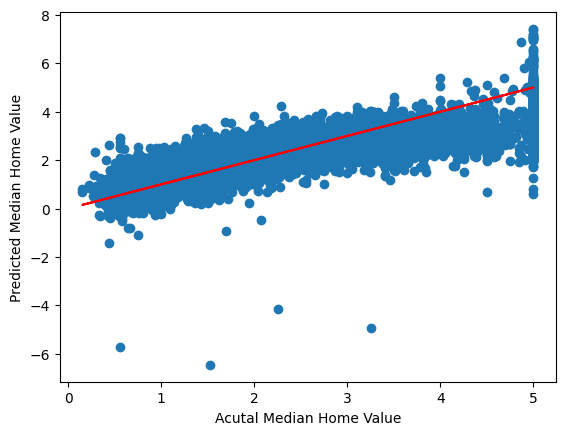

In [ ]:
plt.scatter(y_test,y_predict)
plt.xlabel('Acutal Median Home Value')
plt.ylabel('Predicted Median Home Value')
plt.plot(y_test,y_test, color = 'red')
plt.show()

Next, I scaled the data and ran a least squared regression model to see how that performed on the data. The graph above shows my predicted values vs. actual values in my test set. As we an see here, there are a few points that the model misses wildly. The model also performs much worse on the highest median home values.

In [ ]:
housing_df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,bedrooms_per_room,occupancy_per_room,occupancy_per_bedroom,housing_tuple,Miles_to_City,Nearest_City,pop_april_1990,Pop_To_Miles_Ratio,coast_min,City_Income
0,2.3859,15.0,3.827160,1.112100,1280.0,2.486989,34.60,-120.12,0.980,0.290581,0.649826,2.236300,"(34.6, -120.12)",113.743686,Los Angeles,3485398.0,30642.562529,11.173906,30925
1,3.7188,17.0,6.013373,1.054217,1504.0,3.813084,38.69,-121.22,0.946,0.175312,0.634101,3.616983,"(38.69, -121.22)",90.780508,San Francisco,723959.0,7974.828676,101.635816,33414
2,4.7750,27.0,6.535604,1.103175,1061.0,2.464602,34.71,-120.45,1.576,0.168795,0.377104,2.234099,"(34.71, -120.45)",133.985533,Los Angeles,3485398.0,26013.241273,30.088456,30925
3,2.4138,16.0,3.350203,0.965432,1255.0,2.089286,32.66,-117.09,1.336,0.288171,0.623630,2.164094,"(32.66, -117.09)",5.467741,San Diego,1110549.0,203109.299308,4.173130,33686
4,3.7500,52.0,4.284404,1.069246,1793.0,1.604790,37.80,-122.41,4.500,0.249567,0.374566,1.500861,"(37.8, -122.41)",1.804140,San Francisco,723959.0,401276.469854,13.749526,33414


In [ ]:
X= housing_df.drop(['Nearest_City','housing_tuple','MedHouseVal'],axis=1)
X = sm.add_constant(X)
y=housing_df[['MedHouseVal']]
x_train, x_test, y_train, y_test = train_test_split(X,y, random_state = 64)

In [ ]:
print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

(27852, 17) (27852, 1) (9285, 17) (9285, 1)


In [ ]:
rmodel = sm.OLS(y_train,x_train)
rmodel_results=rmodel.fit()
rmodel_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            MedHouseVal   R-squared:                       0.633
Model:                            OLS   Adj. R-squared:                  0.633
Method:                 Least Squares   F-statistic:                     3005.
Date:                Thu, 13 Apr 2023   Prob (F-statistic):               0.00
Time:                        15:30:37   Log-Likelihood:                -29656.
No. Observations:               27852   AIC:                         5.935e+04
Df Residuals:                   27835   BIC:                         5.949e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                   -35.4463      1.055    -33.585      0.000     -37.515     -33.378
MedInc                    0.4354      0.004    104.560      0.000       0.427       0.444
HouseAge                  0.0067      0.000     17.440      0.000       0.006       0.007
AveRooms                 -0.0215      0.012     -1.854      0.064      -0.044       0.001
AveBedrms                -0.2460      0.084     -2.919      0.004      -0.411      -0.081
Population            -9.701e-06   3.33e-06     -2.911      0.004   -1.62e-05   -3.17e-06
AveOccup                  0.2813      0.026     10.764      0.000       0.230       0.333
Latitude                 -0.3238      0.014    -23.854      0.000      -0.350      -0.297
Longitude                -0.3898      0.013    -30.683      0.000      -0.415      -0.365
bedrooms_per_room         6.3371      0.248     25.593      0.000       5.852       6.822
occupancy_per_room       -1.9534      0.052    -37.816      0.000      -2.055      -1.852
occupancy_per_bedroom    -0.0433      0.028     -1.563      0.118      -0.098       0.011
Miles_to_City            -0.0028      0.000    -15.265      0.000      -0.003      -0.002
pop_april_1990         9.207e-08    5.8e-09     15.887      0.000    8.07e-08    1.03e-07
Pop_To_Miles_Ratio     1.302e-07   1.48e-08      8.800      0.000    1.01e-07    1.59e-07
coast_min                 0.0013      0.000      3.763      0.000       0.001       0.002
City_Income           -3.509e-06    1.1e-06     -3.203      0.001   -5.66e-06   -1.36e-06
==============================================================================
Omnibus:                     4944.693   Durbin-Watson:                   2.005
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            11604.980
Skew:                           1.011   Prob(JB):                         0.00
Kurtosis:                       5.431   Cond. No.                     6.33e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.33e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
y_predict = rmodel_results.predict(x_test)

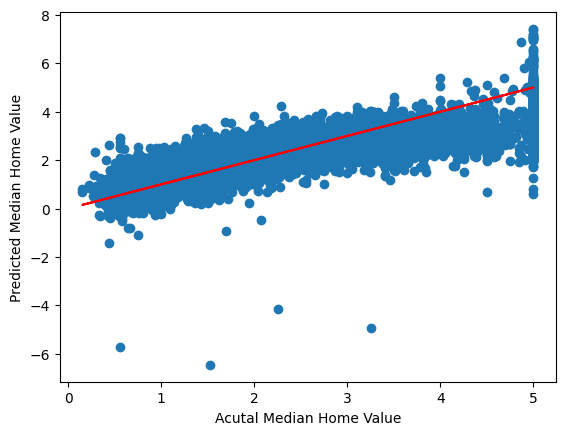

In [ ]:
plt.scatter(y_test,y_predict)
plt.xlabel('Acutal Median Home Value')
plt.ylabel('Predicted Median Home Value')
plt.plot(y_test,y_test, color = 'red')
plt.show()

In [ ]:
import os
os.chdir("/content/drive/MyDrive/Colab Data Sets")

# save the modified dataset
housing_df.to_csv("housing_eda.csv", index=False)
